In [1]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra
from sentence_transformers import SentenceTransformer
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# LLM Embedding

In [2]:
df = pd.read_csv("cleaned_data_v2.csv")

In [4]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

def plot_transformations(df, column_name):
    # Extract the column data
    data = df[column_name].values.reshape(-1, 1)

    # Create a figure and axis object
    fig, axs = plt.subplots(3, 2, figsize=(10, 6))

    # Plot the original data
    axs[0, 0].hist(data, bins=30, color='skyblue', edgecolor='black')
    axs[0, 0].set_title('Original Distribution')
    axs[0, 0].set_xlabel(column_name)
    axs[0, 0].set_ylabel('Frequency')

    # Logarithmic transformation
    log_transformed = np.log1p(data)
    axs[0, 1].hist(log_transformed, bins=30, color='orange', edgecolor='black')
    axs[0, 1].set_title('Logarithmic Transformation')
    axs[0, 1].set_xlabel('Log-transformed ' + column_name)
    axs[0, 1].set_ylabel('Frequency')

    # Square root transformation
    sqrt_transformed = np.sqrt(data)
    axs[1, 0].hist(sqrt_transformed, bins=30, color='green', edgecolor='black')
    axs[1, 0].set_title('Square Root Transformation')
    axs[1, 0].set_xlabel('Square Root-transformed ' + column_name)
    axs[1, 0].set_ylabel('Frequency')

    # Cube root transformation
    cube_root_transformed = np.cbrt(data)
    axs[1, 1].hist(cube_root_transformed, bins=30, color='red', edgecolor='black')
    axs[1, 1].set_title('Cube Root Transformation')
    axs[1, 1].set_xlabel('Cube Root-transformed ' + column_name)
    axs[1, 1].set_ylabel('Frequency')

    # Standard scaling
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)
    axs[2, 0].hist(scaled_data, bins=30, color='purple', edgecolor='black')
    axs[2, 0].set_title('Standard Scaled Distribution')
    axs[2, 0].set_xlabel('Standard Scaled ' + column_name)
    axs[2, 0].set_ylabel('Frequency')

    # Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(data)
    axs[2, 1].hist(scaled_data, bins=30, color='pink', edgecolor='black')
    axs[2, 1].set_title('Min-Max Scaled Distribution')
    axs[2, 1].set_xlabel('Min-Max Scaled ' + column_name)
    axs[2, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

def apply_transformations(df, column_names, methods):
    """
    Apply transformations to specified columns in the DataFrame.

    Parameters:
    - df: DataFrame
    - column_names: List of column names to transform
    - methods: List of transformation methods corresponding to each column
               Valid methods: 'log', 'sqrt', 'cube'

    Returns:
    - transformed_df: DataFrame with transformations applied to specified columns
    """

    transformed_df = df.copy()

    # Iterate over each column name and corresponding method
    for col, method in zip(column_names, methods):
        # Define the transformation function based on the specified method
        if method == 'log':
            transformation_func = np.log1p
        elif method == 'sqrt':
            transformation_func = np.sqrt
        elif method == 'cube':
            transformation_func = np.cbrt
        else:
            raise ValueError(f"Invalid transformation method: {method}")

        # Apply the transformation to the specified column
        transformed_column = transformation_func(transformed_df[col])

        # Update the column in the transformed DataFrame
        transformed_df[col] = transformed_column

    return transformed_df


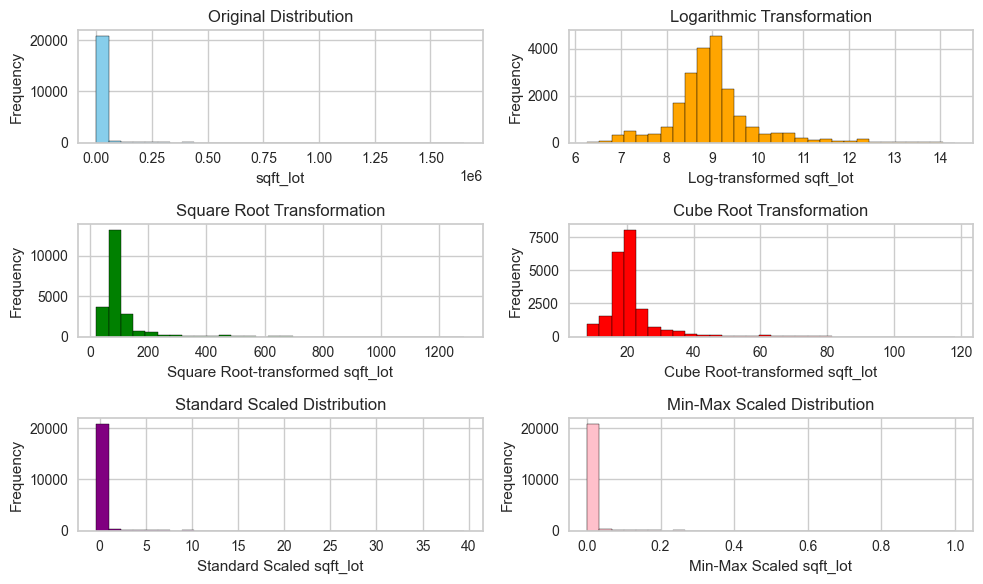

In [5]:
plot_transformations(df, 'sqft_lot')

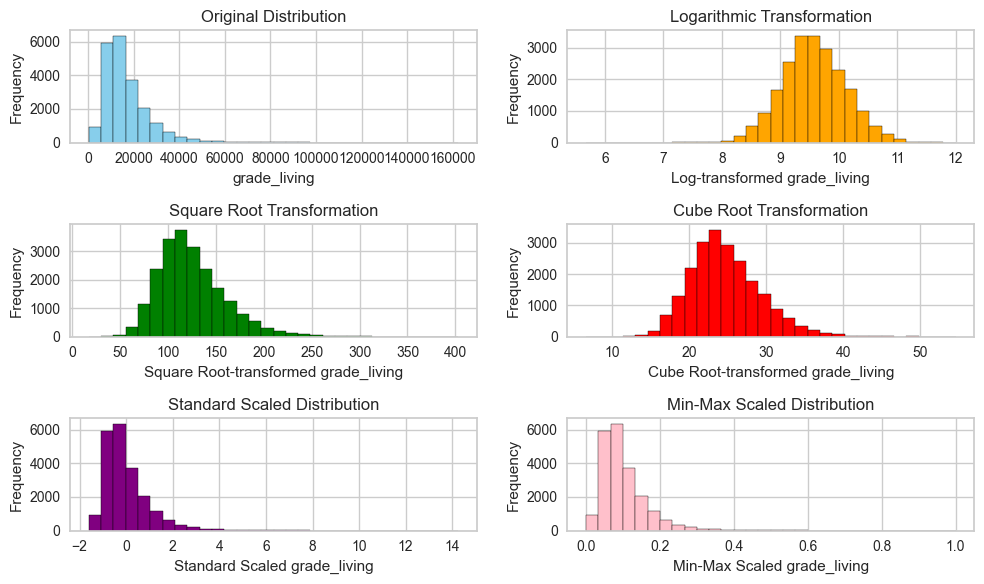

In [6]:
plot_transformations(df, 'grade_living')

In [7]:
transformed_df = apply_transformations(df, ['sqft_lot','grade_living'], 
                                           ['log','log'])
transformed_df

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,221900.0,3,1.00,8.639588,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,9.019301
1,538000.0,3,2.25,8.887791,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,9.797627
2,180000.0,2,1.00,9.210440,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,8.438366
3,604000.0,4,3.00,8.517393,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,9.526683
4,510000.0,3,2.00,8.997271,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,9.506065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,7.031741,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,2-3 Bathrooms,11391.0,27.1,1.708484,False,9.412546
21609,400000.0,4,2.50,8.668024,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,2-3 Bathrooms,6034.0,29.8,1.990125,False,9.824498
21610,402101.0,2,0.75,7.208600,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,Studio or 1 Bathroom,9389.0,29.3,0.886906,False,8.873608
21611,400000.0,3,2.50,7.778630,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,2-3 Bathrooms,487.0,29.3,2.354171,False,9.457279


In [8]:
# bedrooms to 3 categories as >4 , <3 and others
transformed_df['bedrooms_cat'] = transformed_df['bedrooms'].apply(lambda x: '>4' if x>4 else '<3' if x<3 else '3-4')
transformed_df['lot_size_category'] = pd.qcut(transformed_df['sqft_lot'], q=3, labels=False)
transformed_df['grade_living_category'] = pd.qcut(transformed_df['grade_living'], q=3, labels=False)

In [9]:
def compile_text(x):
    text =  f"""Bedrooms: {x['bedrooms_cat']}, 
                Lot Size (sqft): {x['lot_size_category']}, 
                Floors: {x['floors']}, 
                View: {x['view']}, 
                Condition: {x['condition']}, 
                Bathroom Category: {x['bathroom_category']}, 
                Near Shore: {x['is_near_shore']}, 
                Grade Living: {x['grade_living_category']}
            """
    return text

In [10]:
sentences = transformed_df.apply(lambda x: compile_text(x), axis=1).tolist()

In [11]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [12]:
output = model.encode(sentences=sentences, show_progress_bar= True, normalize_embeddings  = True)

Batches: 100%|██████████| 676/676 [00:24<00:00, 28.06it/s]


In [13]:
df_embedding = pd.DataFrame(output)

In [14]:
df_embedding.to_csv("embedding_out_norm.csv",index = False)


In [16]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


# Outliers

In [17]:
df_embedding = pd.read_csv("embedding_out_norm.csv")

In [79]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding)

out = clf.predict(df_embedding) 
df_embedding["outliers"] = out
transformed_df["outliers"] = out

df_embedding_no_out = df_embedding[df_embedding["outliers"] == 0]
df_embedding_with_out = df_embedding.copy()

In [80]:
df_embedding_no_out.shape

(19451, 385)

In [81]:
df_embedding_with_out.shape

(21613, 385)

## DBSCAN ALL DATA

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
import numpy as np

### DBSCAN ALL DATA

##### GridSearch ALL DATA DBSCAN

In [ ]:


# # Generate sample data
# X = df_embedding_with_out.copy()

# # Define parameter grid
# eps_values = np.linspace(0.1, 2.0, 10)
# min_samples_values = range(2, 10)

# best_silhouette_score = -1
# best_calinski_score = -1
# best_params = {}

# # Perform grid search
# for eps in eps_values:
#     for min_samples in min_samples_values:
#         dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
#         labels = dbscan.fit_predict(X)
#         if len(np.unique(labels)) > 1:  # Check if more than one cluster is formed
#             silhouette = silhouette_score(X, labels)
#             calinski = calinski_harabasz_score(X, labels)
#             print(f"Parameters: (eps={eps}, min_samples={min_samples}) - Silhouette Score: {silhouette}, Calinski-Harabasz Score: {calinski}")
#             if silhouette > best_silhouette_score:
#                 best_silhouette_score = silhouette
#                 best_params['silhouette'] = (eps, min_samples)
#             if calinski > best_calinski_score:
#                 best_calinski_score = calinski
#                 best_params['calinski'] = (eps, min_samples)

# print("\nBest parameters for Silhouette Score:", best_params['silhouette'])
# print("Best parameters for Calinski-Harabasz Score:", best_params['calinski'])


Parameters: (eps=0.1, min_samples=2) - Silhouette Score: 0.44950259380914187, Calinski-Harabasz Score: 19938.26007461837
Parameters: (eps=0.1, min_samples=3) - Silhouette Score: 0.4501654386613926, Calinski-Harabasz Score: 21893.589297802922
Parameters: (eps=0.1, min_samples=4) - Silhouette Score: 0.4501540320507644, Calinski-Harabasz Score: 23015.36169893178
Parameters: (eps=0.1, min_samples=5) - Silhouette Score: 0.45012609224692035, Calinski-Harabasz Score: 24268.59064886071
Parameters: (eps=0.1, min_samples=6) - Silhouette Score: 0.45012609224692035, Calinski-Harabasz Score: 24268.59064886071
Parameters: (eps=0.1, min_samples=7) - Silhouette Score: 0.4500582352219114, Calinski-Harabasz Score: 24259.639155149413
Parameters: (eps=0.1, min_samples=8) - Silhouette Score: 0.45017371544456486, Calinski-Harabasz Score: 24212.644245095067
Parameters: (eps=0.1, min_samples=9) - Silhouette Score: 0.45017371544456486, Calinski-Harabasz Score: 24212.644245095067
Parameters: (eps=0.311111111111

KeyboardInterrupt: 

In [103]:
# dbscan then silhouette score and calinski harabasz score then assign labels to varialbe as well as new column
dbscan = DBSCAN(eps=0.3, min_samples=5, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_embedding_with_out)
silhouette = silhouette_score(df_embedding_with_out, dbscan_labels)
calinski = calinski_harabasz_score(df_embedding_with_out, dbscan_labels)

print(f"Silhouette Score ALL DATA: {silhouette}")
print(f"Calinski-Harabasz Score ALL DATA: {calinski}")

df_embedding_with_out["cluster_db_all"] = dbscan_labels
transformed_df["cluster_db_all"] = dbscan_labels
df_embedding_with_out["cluster_db_all"].value_counts()

Silhouette Score ALL DATA: 0.8704214222083448
Calinski-Harabasz Score ALL DATA: 177154.1148049729


cluster_db_all
0    19451
1     2162
Name: count, dtype: int64

In [105]:
# transformed df outliers and cluster_db_all same true counts
index = transformed_df["outliers"] != transformed_df["cluster_db_all"]
transformed_df[index].shape


(0, 25)

In [106]:
# std of price where cluster_db_all is -1
print(transformed_df[transformed_df["cluster_db_all"] == 1]["price"].std())
print(transformed_df[transformed_df["cluster_db_all"] == 0]["price"].std())
print(transformed_df["price"].std())


679175.9467605579
306642.0622388907
367127.19648269983


### DBSCAN NOUT

In [108]:
# Generate sample data
X = df_embedding_no_out.copy()

# Define parameter grid
eps_values = np.linspace(0.1, 1.0, 5)
min_samples_values = range(2, 5)

best_silhouette_score = -1
best_calinski_score = -1
best_params = {}

# Perform grid search
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
        labels = dbscan.fit_predict(X)
        if len(np.unique(labels)) > 1:  # Check if more than one cluster is formed
            silhouette = silhouette_score(X, labels)
            calinski = calinski_harabasz_score(X, labels)
            print(f"Parameters: (eps={eps}, min_samples={min_samples}) - Silhouette Score: {silhouette}, Calinski-Harabasz Score: {calinski}")
            if silhouette > best_silhouette_score:
                best_silhouette_score = silhouette
                best_params['silhouette'] = (eps, min_samples)
            if calinski > best_calinski_score:
                best_calinski_score = calinski
                best_params['calinski'] = (eps, min_samples)

print("\nBest parameters for Silhouette Score:", best_params['silhouette'])
print("Best parameters for Calinski-Harabasz Score:", best_params['calinski'])


Parameters: (eps=0.1, min_samples=2) - Silhouette Score: 0.44030562183082567, Calinski-Harabasz Score: 7266.406453292778
Parameters: (eps=0.1, min_samples=3) - Silhouette Score: 0.44030562183082567, Calinski-Harabasz Score: 7266.406453292778
Parameters: (eps=0.1, min_samples=4) - Silhouette Score: 0.44030562183082567, Calinski-Harabasz Score: 7266.406453292778

Best parameters for Silhouette Score: (0.1, 2)
Best parameters for Calinski-Harabasz Score: (0.1, 2)


In [110]:
# dbscan then silhouette score and calinski harabasz score then assign labels to varialbe as well as new column
dbscan = DBSCAN(eps=0.1, min_samples=2, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_embedding_no_out)
silhouette = silhouette_score(df_embedding_no_out, dbscan_labels)
calinski = calinski_harabasz_score(df_embedding_no_out, dbscan_labels)

print(f"Silhouette Score ALL DATA: {silhouette}")
print(f"Calinski-Harabasz Score ALL DATA: {calinski}")

df_embedding_no_out["cluster_db_nout"] = dbscan_labels
df_embedding_no_out["cluster_db_nout"].value_counts()

Silhouette Score ALL DATA: 0.9058761792483577
Calinski-Harabasz Score ALL DATA: 884350.6633498388


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_38138/3293204711.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



cluster_db_nout
1    12942
0     1993
4     1584
3     1146
5     1020
2      742
6       12
7       12
Name: count, dtype: int64

<b> NOUT DBSCAN results are not consistent</b> 

# K means

### ALL DATA

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


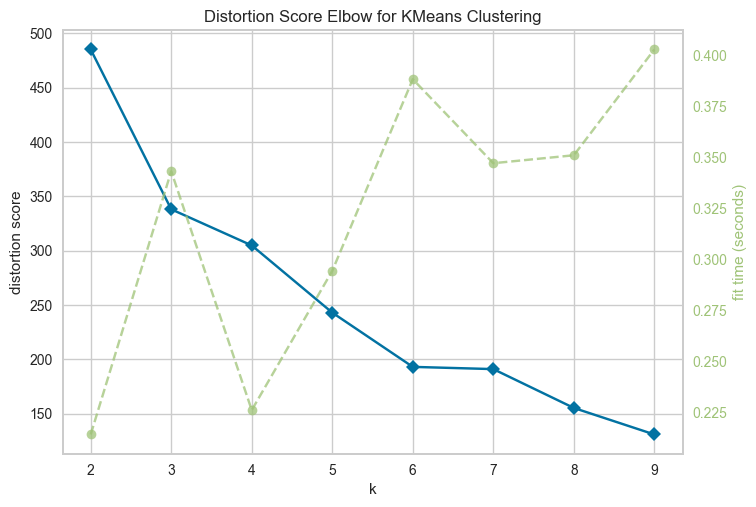

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [27]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=False)
 
visualizer.fit(df_embedding_with_out)        # Fit the data to the visualizer
visualizer.show()       

##### Gridsearch ALL DATA K means

N cluster: 2
For n_clusters = 2 The average silhouette_score is : 0.8212018300644796
N cluster: 3
For n_clusters = 3 The average silhouette_score is : 0.5347658966931773
N cluster: 4
For n_clusters = 4 The average silhouette_score is : 0.516326857706282


KeyboardInterrupt: 

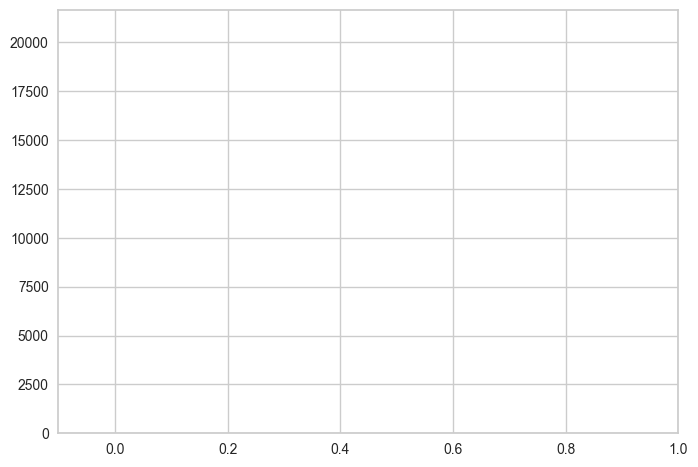

In [35]:
def make_Silhouette_plot(X, n_clusters):
    plt.xlim([-0.1, 1])
    plt.ylim([0, len(X) + (n_clusters + 1) * 10])
    clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =", n_clusters,
        "The average silhouette_score is :", silhouette_avg,
    )
# Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        plt.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
        plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
        plt.xlabel("The silhouette coefficient values", fontsize=24)
        plt.ylabel("Cluster label", fontsize=24)
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        plt.yticks([])  
        plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
range_n_clusters = list(range(2,6))
for n_clusters in range_n_clusters:
    print(f"N cluster: {n_clusters}")
    make_Silhouette_plot(df_embedding_with_out, n_clusters)   
    plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
    plt.close()

In [217]:
n_clusters = 3

clusters = KMeans(n_clusters=n_clusters, init = "k-means++", random_state=10).fit(df_embedding_with_out)
print('ALL DATA', clusters.inertia_)
clusters_predict = clusters.predict(df_embedding_with_out)

ALL DATA 338.0442425948695


### NOUT K MEANS INITIAL

In [218]:
n_clusters = 3

clusters = KMeans(n_clusters=n_clusters, init = "k-means++", random_state=10).fit(df_embedding_no_out)
print('NOUT', clusters.inertia_)
clusters_predict_no_out = clusters.predict(df_embedding_no_out)

NOUT 3274.7741352920193


In [219]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score all data: {davies_bouldin_score(df_embedding_with_out,clusters_predict)}")
print(f"Davies bouldin score without outlier: {davies_bouldin_score(df_embedding_no_out,clusters_predict_no_out)}")


"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score all data: {calinski_harabasz_score(df_embedding_with_out,clusters_predict)}")
print(f"Calinski Score without outlier: {calinski_harabasz_score(df_embedding_no_out,clusters_predict_no_out)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score All data: {silhouette_score(df_embedding_with_out,clusters_predict)}")
print(f"Silhouette Score without outliers: {silhouette_score(df_embedding_no_out,clusters_predict_no_out)}")

Davies bouldin score all data: 0.5746524863735972
Davies bouldin score without outlier: 0.24060055924368684
Calinski Score all data: 131784.31140363266
Calinski Score without outlier: 90830.99569756596
Silhouette Score All data: 0.5422980107712472
Silhouette Score without outliers: 0.8122162303191274


The metrics indicate that removing outliers (NOUT) leads to better clustering performance according to the Davies-Bouldin Index and Silhouette Score. However, the Calinski-Harabasz Index is higher with outliers, which might be due to the nature of this metric and the influence of outliers on overall cluster dispersion. Overall, the removal of outliers seems to yield more cohesive and better-separated clusters, as evidenced by the Davies-Bouldin and Silhouette scores.

In [220]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_with_out, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space for All Data", opacity=1, width_line = 0.01)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            137.766        35.69%                     35.69%
1             79.470        20.59%                     56.28%
2             44.684        11.58%                     67.85%


In [221]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out, clusters_predict_no_out)
plot_pca_3d(df_pca_3d, title = "PCA Space without Outliers", opacity=1, width_line = 0.01)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            125.698        32.65%                     32.65%
1             63.936        16.61%                     49.26%
2             50.413        13.09%                     62.35%


In [216]:
sampling_data = df_embedding_with_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space ALL DATA", opacity=1, width_line = 0.1)

In [ ]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict_no_out).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space NO Outlier", opacity=1, width_line = 0.1)

# COMPARISONS

In [222]:
df_with_outliers = transformed_df.copy()

In [223]:
df_with_outliers.head()

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,outliers,cluster_db_all
0,221900.0,3,1.00,8.639588,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,9.019301,3-4,0,0,0,0
1,538000.0,3,2.25,8.887791,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,9.797627,3-4,1,2,0,0
2,180000.0,2,1.00,9.210440,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,8.438366,<3,2,0,0,0
3,604000.0,4,3.00,8.517393,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,9.526683,3-4,0,1,0,0
4,510000.0,3,2.00,8.997271,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,9.506065,3-4,1,1,0,0


In [224]:
df_with_outliers["cluster"] = clusters_predict 
# create a new column for cluster_nout and assign the respective values based on index from clusters_predict_no_out
df_with_outliers["cluster_nout"] = df_with_outliers.index.map(dict(zip(df_embedding_no_out.index, clusters_predict_no_out)))

# assign -1 to remaining values
df_with_outliers["cluster_nout"].fillna(-1, inplace=True)
# outliers equals to DBSCORE cluster so no need to add it again
df_with_outliers["cluster_nout"].value_counts()

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_38138/1222076199.py:6: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





cluster_nout
 0.0    13684
 1.0     3774
-1.0     2162
 2.0     1993
Name: count, dtype: int64

In [225]:
# clusters on lat long scatter plot
fig = px.scatter_mapbox(df_with_outliers, 
                        lat="lat", 
                        lon="long", 
                        color="cluster",
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        zoom=10,
                        mapbox_style="carto-positron",
                        title="Clusters on Lat Long ALL DATA",
                        height=800,
                        width=1000)

fig.show()

In [226]:
# clusters on lat long scatter plot
fig = px.scatter_mapbox(df_with_outliers[df_with_outliers["cluster_nout"] != -1], 
                        lat="lat", 
                        lon="long", 
                        color="cluster_nout",
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        zoom=10,
                        mapbox_style="carto-positron",
                        title="Clusters on Lat Long NO OUTLIER",
                        height=800,
                        width=1000)

fig.show()

In [227]:
df_group = df_with_outliers.groupby('cluster').agg(
    {
        'price': 'mean',
        'bedrooms': lambda x: x.value_counts().index[0],
        'bathrooms': lambda x: x.value_counts().index[0],
        'sqft_lot': 'mean',
        'floors': lambda x: x.value_counts().index[0],
        'waterfront': lambda x: x.value_counts().index[0],
        'view': lambda x: x.value_counts().index[0],
        'condition': lambda x: x.value_counts().index[0],
        'yr_built': 'mean',
        'yr_renovated': 'mean',
        'zipcode': lambda x: x.value_counts().index[0],
        'lat': 'mean',
        'long': 'mean',
        'nearest_station_distance_km': 'mean',
        'density': 'mean',
        'commute_time': 'mean',
        'distance_to_point_km': 'mean',
        'is_near_shore': lambda x: x.value_counts().index[0],
        'grade_living': lambda x: x.value_counts().index[0]
    }
).sort_values("price").reset_index()

df_group


,cluster,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,2,326560.836549,3,1.0,9.042087,1.0,0,0,3,1948.191118,65.191482,98133,47.553015,-122.256051,13098.464446,5353.277394,30.076338,3.160945,False,9.036106
1,0,550541.050048,3,2.5,9.000144,2.0,0,0,3,1977.595187,77.514188,98038,47.557776,-122.196503,15716.932735,4704.545917,30.180472,3.351342,False,9.419060
2,1,730631.216466,2,1.0,8.846781,1.0,0,0,3,1949.076318,162.029602,98103,47.586582,-122.294722,8470.300722,7094.499075,29.092229,1.120478,True,8.371242


In [228]:
df_group = df_with_outliers.groupby('cluster_nout').agg(
    {
        'price': 'mean',
        'bedrooms': lambda x: x.value_counts().index[0],
        'bathrooms': lambda x: x.value_counts().index[0],
        'sqft_lot': 'mean',
        'floors': lambda x: x.value_counts().index[0],
        'waterfront': lambda x: x.value_counts().index[0],
        'view': lambda x: x.value_counts().index[0],
        'condition': lambda x: x.value_counts().index[0],
        'yr_built': 'mean',
        'yr_renovated': 'mean',
        'zipcode': lambda x: x.value_counts().index[0],
        'lat': 'mean',
        'long': 'mean',
        'nearest_station_distance_km': 'mean',
        'density': 'mean',
        'commute_time': 'mean',
        'distance_to_point_km': 'mean',
        'is_near_shore': lambda x: x.value_counts().index[0],
        'grade_living': lambda x: x.value_counts().index[0]
    }
).sort_values("price").reset_index()

df_group


,cluster_nout,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,2.0,333054.179629,3,1.0,8.988543,1.0,0,0,3,1949.548419,55.944305,98133,47.546453,-122.252153,13647.174765,5378.458103,30.073106,3.098972,False,9.036106
1,0.0,508850.132929,3,2.5,9.060907,1.0,0,0,3,1977.131833,67.311459,98038,47.550989,-122.189716,16631.742178,4390.222742,30.457089,3.648278,False,9.372544
2,1.0,653528.913355,5,2.5,8.816484,2.0,0,0,3,1972.683890,116.929253,98103,47.584901,-122.235065,11587.055370,5960.549285,29.158400,2.269380,False,9.729194
3,-1.0,730631.216466,2,1.0,8.846781,1.0,0,0,3,1949.076318,162.029602,98103,47.586582,-122.294722,8470.300722,7094.499075,29.092229,1.120478,True,8.371242


In [229]:
# print std of price for each cluster
print(df_with_outliers.groupby('cluster')['price'].std().astype(int))
print('without clusters: ',df_with_outliers['price'].std().astype(int))


cluster
0    314604
1    679175
2    144484
Name: price, dtype: int64
without clusters:  367127


In [234]:
df_with_outliers['cluster'].value_counts()

cluster
0    16704
2     2747
1     2162
Name: count, dtype: int64

In [231]:
# print std of price for each cluster in cluster_nout and cluster columns, as well as their counts

print(df_with_outliers.groupby('cluster_nout')['price'].std().astype(int))
print('without clusters: ',df_with_outliers['price'].std().astype(int))


cluster_nout
-1.0    679175
 0.0    271370
 1.0    411690
 2.0    147133
Name: price, dtype: int64
without clusters:  367127


In [232]:
df_with_outliers[(df_with_outliers['cluster'] == 2) & (df_with_outliers['cluster_nout'] == 1)].shape

(12, 27)

In [233]:
df_with_outliers['cluster_nout'].value_counts()

cluster_nout
 0.0    13684
 1.0     3774
-1.0     2162
 2.0     1993
Name: count, dtype: int64

In [164]:
pd.set_option('display.max_columns', None)

In [241]:
df_with_outliers

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,outliers_ecod,cluster_all_data,cluster_no_outlier
0,221900.0,3,1.00,8.639588,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,9.019301,3-4,0,0,0,2,2.0
1,538000.0,3,2.25,8.887791,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,9.797627,3-4,1,2,0,0,0.0
2,180000.0,2,1.00,9.210440,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,8.438366,<3,2,0,0,2,0.0
3,604000.0,4,3.00,8.517393,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,9.526683,3-4,0,1,0,0,1.0
4,510000.0,3,2.00,8.997271,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,9.506065,3-4,1,1,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,7.031741,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,2-3 Bathrooms,11391.0,27.1,1.708484,False,9.412546,3-4,0,1,0,0,0.0
21609,400000.0,4,2.50,8.668024,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,2-3 Bathrooms,6034.0,29.8,1.990125,False,9.824498,3-4,0,2,0,0,0.0
21610,402101.0,2,0.75,7.208600,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,Studio or 1 Bathroom,9389.0,29.3,0.886906,False,8.873608,<3,0,0,1,1,-1.0
21611,400000.0,3,2.50,7.778630,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,2-3 Bathrooms,487.0,29.3,2.354171,False,9.457279,3-4,0,1,0,0,0.0


In [237]:
df_with_outliers.drop(columns = ['cluster_db_all'], inplace = True)


In [247]:
df_with_outliers.to_csv("clustered_data_v2.csv",index = False)

In [240]:
# change the column name for cluster
df_with_outliers.rename(columns = {'outliers':'outliers_ecod'}, inplace = True)
df_with_outliers.rename(columns = {'cluster':'cluster_all_data'}, inplace = True)
df_with_outliers.rename(columns = {'cluster_nout':'cluster_no_outlier'}, inplace = True)

In [243]:
# List of column names used in compile_text
columns = [
    'bedrooms_cat', 
    'lot_size_category', 
    'floors', 
    'view', 
    'condition', 
    'bathroom_category', 
    'is_near_shore', 
    'grade_living_category'
]

# distribution of outliers_df acroos clusters
df_with_outliers.groupby('cluster_all_data')['grade_living_category'].value_counts().unstack()


grade_living_category,0,1,2
cluster_all_data,,,
0,3556,6705,6443
1,1189,254,719
2,2465,275,7


In [245]:
# distribution of outliers_df acroos clusters
print("When used ALL DATA, outliers are formed CLUSTER-1")
df_with_outliers.groupby('outliers_ecod')['cluster_all_data'].value_counts(normalize=True).unstack().fillna(0) * 100


When used ALL DATA, outliers are formed CLUSTER-1


cluster_all_data,0,1,2
outliers_ecod,,,
0,85.877333,0.0,14.122667
1,0.000000,100.0,0.000000


In [246]:
# distribution of outliers_df acroos clusters
df_with_outliers.groupby('cluster_no_outlier')['grade_living_category'].value_counts().unstack()


grade_living_category,0,1,2
cluster_no_outlier,,,
-1.0,1189,254,719
0.0,3419,5559,4706
1.0,857,1180,1737
2.0,1745,241,7


In [56]:
df_with_outliers.head()

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,...,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,cluster
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,...,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260,2
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,...,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990,1
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,...,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620,2
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,...,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720,1
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,...,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440,1


In [157]:
# column_outlier_check = 'price'

# # calculate outliers based on price for IQR and Z-score and save it in a new column
# Q1 = df_with_outliers[column_outlier_check].quantile(0.25)
# Q3 = df_with_outliers[column_outlier_check].quantile(0.75)
# IQR = Q3 - Q1
# df_with_outliers['outliers_iqr'] = (df_with_outliers[column_outlier_check] < (Q1 - 1.5 * IQR)) | (df_with_outliers[column_outlier_check] > (Q3 + 1.5 * IQR))

# df_with_outliers['outliers_zscore'] = (np.abs(df_with_outliers[column_outlier_check] - df_with_outliers[column_outlier_check].mean()) > (3 * df_with_outliers[column_outlier_check].std()))

# # compare the number of outliers based on IQR and Z-score and outliers column
# print(df_with_outliers['outliers_iqr'].value_counts())
# print(df_with_outliers['outliers_zscore'].value_counts())
# print(df_with_outliers['outliers'].value_counts())

# # show how many rows overlap between the three columns
# print(df_with_outliers[(df_with_outliers['outliers'] == True) & (df_with_outliers['outliers_iqr'] == True) & (df_with_outliers['outliers_zscore'] == True)].shape[0], 'ALL COMMON')
# print(df_with_outliers[(df_with_outliers['outliers'] == True) & (df_with_outliers['outliers_iqr'] == True)].shape[0], 'EOCD vs IQR')
# print(df_with_outliers[(df_with_outliers['outliers'] == True) & (df_with_outliers['outliers_zscore'] == True)].shape[0], 'EOCD vs Z')
# print(df_with_outliers[(df_with_outliers['outliers_iqr'] == True) & (df_with_outliers['outliers_zscore'] == True)].shape[0], 'IQR vs Z')


outliers_iqr
False    20467
True      1146
Name: count, dtype: int64
outliers_zscore
False    21207
True       406
Name: count, dtype: int64
outliers
0    19451
1     2162
Name: count, dtype: int64
183 ALL COMMON
363 EOCD vs IQR
183 EOCD vs Z
406 IQR vs Z


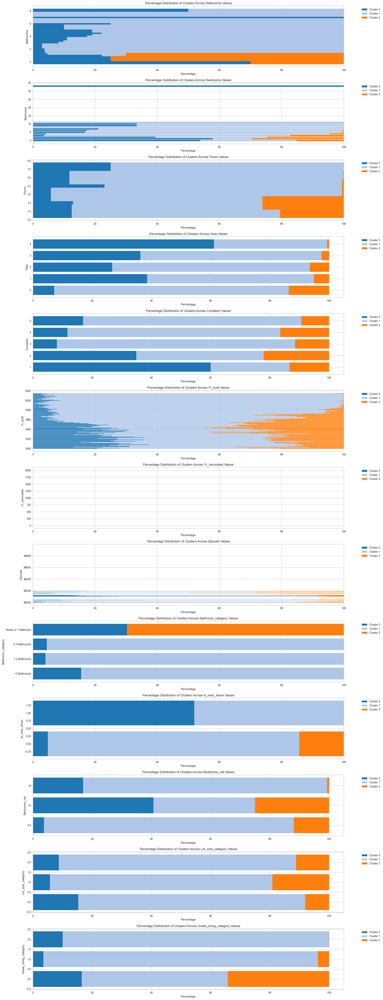

In [64]:
# columns_to_plot = ['bathrooms', 'bedrooms','floors', 'view', 'condition', 'yr_built', 'yr_renovated', 'zipcode','bathroom_category','is_near_shore','bedrooms_cat','lot_size_category','grade_living_category']
# # Create a figure with multiple subplots
# fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(20,4 * len(columns_to_plot)))

# # If only one column, axes is not a list, so we make it a list for uniformity
# if len(columns_to_plot) == 1:
#     axes = [axes]

# # Iterate over each column and plot
# for ax, column in zip(axes, columns_to_plot):
#     # Calculate the percentage distribution of column values within each cluster
#     distribution_df = df_with_outliers.groupby(column)['cluster'].value_counts(normalize=True).unstack().fillna(0) * 100

#     # Plot each cluster as a stack
#     bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
#     colors = sns.color_palette("tab20", len(distribution_df.columns))

#     for i, cluster in enumerate(distribution_df.columns):
#         ax.barh(distribution_df.index, distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
#         bottom += distribution_df[cluster]

#     # Customize the plot
#     ax.set_title(f'Percentage Distribution of Clusters Across {column.capitalize()} Values')
#     ax.set_xlabel('Percentage')
#     ax.set_ylabel(column.capitalize())
#     ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# # Adjust layout to prevent overlap
# plt.tight_layout()
# plt.show()


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff

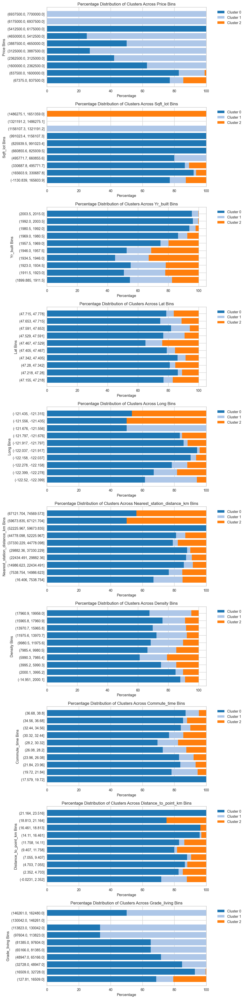

In [234]:
# continuous_columns_to_plot = ['price', 'sqft_lot', 'yr_built','lat', 'long', 'nearest_station_distance_km', 'density', 'commute_time', 'distance_to_point_km','grade_living']

# # Define the number of bins for continuous variables
# num_bins = 10

# # Bin the continuous variables and add them to the DataFrame
# for column in continuous_columns_to_plot:
#     df_with_outliers[f'{column}_bin'] = pd.cut(df_with_outliers[column], bins=num_bins)

# # Create a figure with multiple subplots
# fig, axes = plt.subplots(len(continuous_columns_to_plot), 1, figsize=(10, 4 * len(continuous_columns_to_plot)))

# # If only one column, axes is not a list, so we make it a list for uniformity
# if len(continuous_columns_to_plot) == 1:
#     axes = [axes]

# # Iterate over each column and plot
# for ax, column in zip(axes, continuous_columns_to_plot):
#     binned_column = f'{column}_bin'
    
#     # Calculate the percentage distribution of binned column values within each cluster
#     distribution_df = df_with_outliers.groupby(binned_column)['cluster'].value_counts(normalize=True).unstack().fillna(0) * 100

#     # Plot each cluster as a stack
#     bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
#     colors = sns.color_palette("tab20", len(distribution_df.columns))

#     for i, cluster in enumerate(distribution_df.columns):
#         ax.barh(distribution_df.index.astype(str), distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
#         bottom += distribution_df[cluster]

#     # Customize the plot
#     ax.set_title(f'Percentage Distribution of Clusters Across {column.capitalize()} Bins')
#     ax.set_xlabel('Percentage')
#     ax.set_ylabel(column.capitalize() + ' Bins')
#     ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# # Adjust layout to prevent overlap
# plt.tight_layout()
# plt.show()


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/4252920557.py:20: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/4252920557.py:20: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/4252920557.py:20: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff

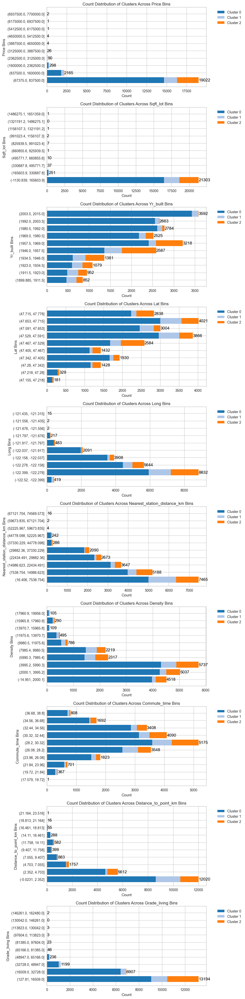

In [258]:
# # Define the number of bins for continuous variables
# num_bins = 10

# # Bin the continuous variables and add them to the DataFrame
# for column in continuous_columns_to_plot:
#     df_no_outliers[f'{column}_bin'] = pd.cut(df_no_outliers[column], bins=num_bins)

# # Create a figure with multiple subplots
# fig, axes = plt.subplots(len(continuous_columns_to_plot), 1, figsize=(10, 4 * len(continuous_columns_to_plot)))

# # If only one column, axes is not a list, so we make it a list for uniformity
# if len(continuous_columns_to_plot) == 1:
#     axes = [axes]

# # Iterate over each column and plot
# for ax, column in zip(axes, continuous_columns_to_plot):
#     binned_column = f'{column}_bin'
    
#     # Calculate the count distribution of binned column values within each cluster
#     distribution_df = df_no_outliers.groupby(binned_column)['cluster'].value_counts().unstack().fillna(0)

#     # Plot each cluster as a stack
#     bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
#     colors = sns.color_palette("tab20", len(distribution_df.columns))

#     for i, cluster in enumerate(distribution_df.columns):
#         ax.barh(distribution_df.index.astype(str), distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
#         bottom += distribution_df[cluster]

#     # Plot the count of each bin
#     for bin_label, count in zip(distribution_df.index.astype(str), distribution_df.sum(axis=1)):
#         ax.text(count, bin_label, str(count), ha='left', va='center', color='black')

#     # Customize the plot
#     ax.set_title(f'Count Distribution of Clusters Across {column.capitalize()} Bins')
#     ax.set_xlabel('Count')
#     ax.set_ylabel(column.capitalize() + ' Bins')
#     ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# # Adjust layout to prevent overlap
# plt.tight_layout()
# plt.show()


## Apply HDBSCAN

Silhouette Score: 0.3804627473068714
Davies-Bouldin Index: 0.7435723043367256
Number of clusters: 216
Noise proportion: 0.49


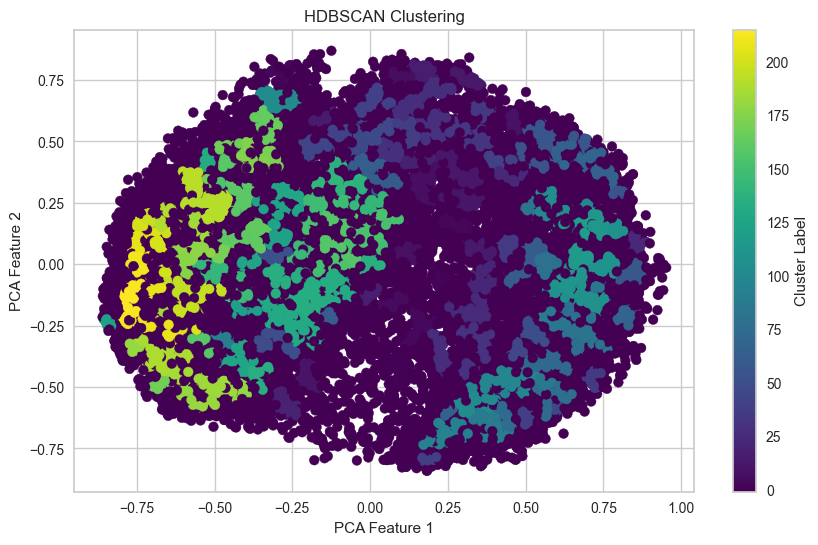

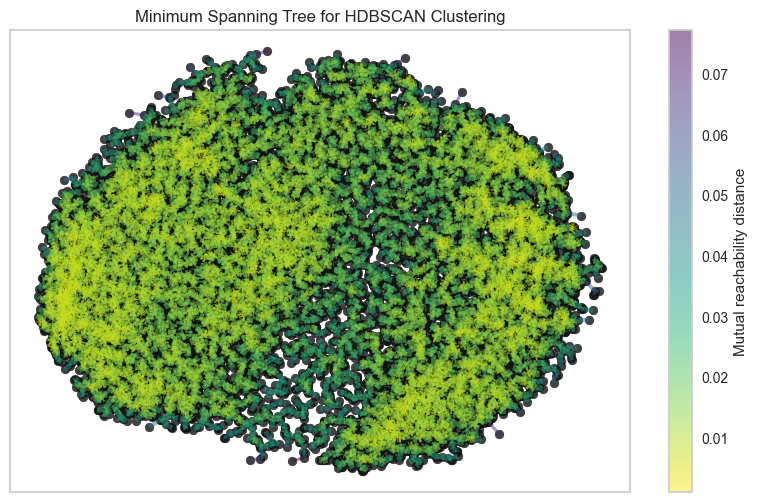

In [292]:
import hdbscan
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Example for scaling and PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_oa)

# Optionally normalize the data
X_normalized = normalize(X_scaled)

# Optionally apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_normalized)

# Adjust HDBSCAN parameters
clusterer = hdbscan.HDBSCAN(min_cluster_size=20, min_samples=5, gen_min_span_tree=True)
clusterer.fit(X_pca)
df_no_outliers['cluster_hdbscan'] = clusterer.labels_

# Evaluate clustering performance
non_noise_points = df_no_outliers['cluster_hdbscan'] != -1
X_filtered = X_pca[non_noise_points]
labels_filtered = df_no_outliers['cluster_hdbscan'][non_noise_points]

if len(set(labels_filtered)) > 1:
    silhouette_avg = silhouette_score(X_filtered, labels_filtered)
    db_index = davies_bouldin_score(X_filtered, labels_filtered)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')
else:
    print("Silhouette Score and Davies-Bouldin Index not applicable (only one cluster)")

num_clusters = len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0)
noise_proportion = np.sum(clusterer.labels_ == -1) / len(clusterer.labels_)
print(f'Number of clusters: {num_clusters}')
print(f'Noise proportion: {noise_proportion:.2f}')

# Visualize the clustering
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusterer.labels_, cmap='viridis', marker='o')
plt.title('HDBSCAN Clustering')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()

# Optionally, plot the minimum spanning tree
plt.figure(figsize=(10, 6))
clusterer.minimum_spanning_tree_.plot()
plt.title('Minimum Spanning Tree for HDBSCAN Clustering')
plt.show()


In [294]:
# pca for df_encoding_with_out
pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_embedding_with_out)

# pca variance ratio
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.sum())


[0.80954333 0.084093   0.03370061]
0.9273369433562071


In [296]:
# Spectral Clustering
from sklearn.cluster import SpectralClustering

# Define the number of clusters
n_clusters = 3

# Apply Spectral Clustering
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', n_jobs=-1)
clusters_predict = spectral.fit_predict(df_embedding_with_out)

# Evaluate clustering performance
if len(set(clusters_predict)) > 1:
    silhouette_avg = silhouette_score(df_embedding_with_out, clusters_predict)
    db_index = davies_bouldin_score(df_embedding_with_out, clusters_predict)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')

# Visualize the clustering
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_with_out, clusters_predict)

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Silhouette Score: -0.3093798679413379
Davies-Bouldin Index: 2.7667252526925323


In [298]:
# Gaussian Mixture Models (GMM) with Robust Initialization
from sklearn.mixture import GaussianMixture

# Define the number of clusters
n_clusters = 3

# Apply Gaussian Mixture Models
gmm = GaussianMixture(n_components=n_clusters, n_init=10)
clusters_predict = gmm.fit_predict(df_embedding_with_out)

# Evaluate clustering performance
if len(set(clusters_predict)) > 1:
    silhouette_avg = silhouette_score(df_embedding_with_out, clusters_predict)
    db_index = davies_bouldin_score(df_embedding_with_out, clusters_predict)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')

# Visualize the clustering
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_with_out, clusters_predict)

Silhouette Score: 0.5347658966931773
Davies-Bouldin Index: 0.6037804697771699


In [302]:
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt

# Assuming df_embedding_with_out is your input dataframe with high-dimensional features

# Standardize the data
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(df_embedding_with_out)
X_scaled = df_embedding_with_out.copy()

# Apply PCA for dimensionality reduction
n_components = 3  # Adjust this number based on your data
pca = PCA(n_components=n_components)
#X_pca = pca.fit_transform(X_scaled)
X_pca = X_scaled.copy()

# Define the number of clusters
n_clusters = 3

# Apply Gaussian Mixture Models with robust initialization
gmm = GaussianMixture(n_components=n_clusters, n_init=10, covariance_type='full', random_state=42)
clusters_predict = gmm.fit_predict(X_pca)

# Evaluate clustering performance
if len(set(clusters_predict)) > 1:
    silhouette_avg = silhouette_score(X_pca, clusters_predict)
    db_index = davies_bouldin_score(X_pca, clusters_predict)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')

# Visualize the clustering in 2D PCA space
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters_predict, cmap='viridis', marker='o')
plt.title('GMM Clustering (PCA-reduced Data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

# Function for 3D PCA Visualization
def get_pca_3d(data, labels):
    pca_3d = PCA(n_components=3)
    data_pca_3d = pca_3d.fit_transform(data)
    df_pca_3d = pd.DataFrame(data_pca_3d, columns=['PCA1', 'PCA2', 'PCA3'])
    df_pca_3d['Cluster'] = labels
    return pca_3d, df_pca_3d

# 3D PCA Visualization
pca_3d_object, df_pca_3d = get_pca_3d(X_scaled, clusters_predict)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca_3d['PCA1'], df_pca_3d['PCA2'], df_pca_3d['PCA3'], c=df_pca_3d['Cluster'], cmap='viridis')

legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)
plt.title('GMM Clustering (3D PCA Visualization)')
plt.show()


Silhouette Score: 0.5347658966931773
Davies-Bouldin Index: 0.6037804697771699


InvalidIndexError: (slice(None, None, None), 0)

<Figure size 1000x600 with 0 Axes>